## Imports

In [1]:
!pip install shap lime

In [2]:
import lime
import lime.lime_tabular
import pandas as pd
import numpy as np

from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import cross_val_score, train_test_split, RepeatedStratifiedKFold

## Mount google drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Preparing data

In [4]:
df = pd.read_csv("/content/drive/MyDrive/Datasets/Hewett's Essay/processed_dataset_3.csv")

In [5]:
df.head()

,Unnamed: 0,corrections,unique_token_count,sent_count,ner_count,comma,question,exclamation,quotation,organization,...,pron,verb,cconj,adv,det,propn,num,part,intj,final_score
0,0,16,180,16,1,18,3,4,7,2,...,48,51,14,15,21,6,0,16,2,6
1,1,25,206,20,11,16,3,1,5,0,...,51,70,18,18,30,12,5,10,0,7
2,2,17,163,14,3,13,0,0,5,1,...,27,40,16,11,25,6,3,10,0,5
3,3,29,264,27,6,14,1,2,6,4,...,33,73,17,20,42,37,0,23,0,8
4,4,17,209,30,5,15,0,0,6,0,...,41,61,16,33,49,3,4,20,0,6


In [6]:
df.drop("Unnamed: 0",inplace=True,axis=1)

In [7]:
df.head()

,corrections,unique_token_count,sent_count,ner_count,comma,question,exclamation,quotation,organization,caps,...,pron,verb,cconj,adv,det,propn,num,part,intj,final_score
0,16,180,16,1,18,3,4,7,2,2,...,48,51,14,15,21,6,0,16,2,6
1,25,206,20,11,16,3,1,5,0,2,...,51,70,18,18,30,12,5,10,0,7
2,17,163,14,3,13,0,0,5,1,5,...,27,40,16,11,25,6,3,10,0,5
3,29,264,27,6,14,1,2,6,4,20,...,33,73,17,20,42,37,0,23,0,8
4,17,209,30,5,15,0,0,6,0,1,...,41,61,16,33,49,3,4,20,0,6


In [8]:
y = df["final_score"]
X = df.drop("final_score", axis=1)
print(X.shape)
print(y.shape)

(12976, 25)
(12976,)


## Split the dataset

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.80, random_state=42)

In [10]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(10380, 25)
(2596, 25)
(10380,)
(2596,)


In [11]:
et = ExtraTreesRegressor(n_estimators=100)
et.fit(X_train, y_train)

ExtraTreesRegressor()

## Model Evaluation

In [12]:
y_pred = et.predict(X_test)

In [13]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [14]:
print("Mean Squared Error: ", mean_squared_error(y_test, y_pred))

Mean Squared Error:  2.8669015793528505


In [15]:
print("Mean Absolute Error: ", mean_absolute_error(y_test, y_pred))

Mean Absolute Error:  1.2918297380585517


## Model Cross Validation

In [16]:
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
n_scores = cross_val_score(et, X, y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1, error_score='raise')

In [17]:
# Report performance
print('Accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))

Accuracy: -1.293 (0.019)


## A. Model Explanation using Lime
Lime is a python package, explaining what machine learning models are doing. It provides you a solid proof about why it predict a particular output. [More](https://github.com/marcotcr/lime)

In [18]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.values.tolist(),
                               class_names=['final_score'], verbose=True, mode='regression')

### Use explainer to explain the prediction
Here, I will choose 3 different instances and use them to explain the predictions.

#### 1. Select 18th instance

In [19]:
# Choose the 18th instance and use it to predict the results
j = 18
exp = explainer.explain_instance(X_test.values[j], et.predict, num_features=25)

Intercept 5.6356332124086475
Prediction_local [6.65887736]
Right: 5.84


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


In [20]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [21]:
exp.as_list()

[('unique_token_count > 155.00', 0.5511866363304297),
 ('part > 12.00', -0.5036497825742176),
 ('det > 27.00', 0.4185745488682613),
 ('corrections > 14.00', -0.3417704893665489),
 ('ner_count > 6.00', 0.2521451850792316),
 ('sent_count > 19.00', 0.22439722473319756),
 ('propn <= 1.00', -0.21847979622930846),
 ('noun > 59.25', 0.18602861279797972),
 ('adj > 19.00', 0.17431690462237032),
 ('pron > 41.00', -0.14980579384997028),
 ('num > 2.00', -0.1428079084205497),
 ('intj <= 0.00', 0.14204866338642014),
 ('adv > 17.00', 0.12612362247048747),
 ('comma > 12.00', 0.12432193944318579),
 ('verb > 46.00', 0.11669132711675033),
 ('organization <= 0.00', 0.112196795047482),
 ('location <= 0.00', -0.09639647268745405),
 ('exclamation <= 0.00', -0.07376100819744312),
 ('question <= 0.00', 0.06910644152939623),
 ('person <= 0.00', 0.03890602867698373),
 ('percent <= 0.00', -0.03662581677001471),
 ('caps <= 0.00', 0.03647038331296478),
 ('cconj > 12.00', -0.031460236282537676),
 ('date <= 0.00', 0.

##### ***Interpretation***
- The predicted value of the final score is 5.75.
- The variables unique_token_count, part, corrections, propn, num, pron, location, exclamation, and cconj have positive influence while all other have negative influence on predicted final score.

#### 2. Select 23th instance

In [22]:
# Choose the 23th instance and use it to predict the results
j = 23
exp = explainer.explain_instance(X_test.values[j], et.predict, num_features=25)

Intercept 5.917026348554576
Prediction_local [5.84724361]
Right: 6.13


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


In [23]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [24]:
exp.as_list()

[('sent_count <= 5.00', -0.31390084447236644),
 ('adj <= 5.00', -0.3047339077073251),
 ('corrections <= 4.00', 0.2627733694051929),
 ('intj <= 0.00', 0.1455991831374184),
 ('organization <= 0.00', 0.11093320779902818),
 ('location <= 0.00', -0.09811049634285923),
 ('num <= 0.00', 0.09589176726994872),
 ('18.00 < noun <= 32.00', 0.08211096555519211),
 ('percent <= 0.00', -0.07883960976525865),
 ('6.00 < cconj <= 12.00', 0.06908440979943496),
 ('5.00 < part <= 12.00', -0.06307489616710765),
 ('2.00 < comma <= 6.00', -0.06094827446955904),
 ('14.00 < verb <= 23.00', 0.05904974809017087),
 ('1.00 < propn <= 4.00', 0.052040336999300336),
 ('9.00 < pron <= 19.00', 0.05009631640092766),
 ('question <= 0.00', 0.049049904968683035),
 ('66.75 < unique_token_count <= 101.00', -0.046822123560710686),
 ('10.00 < det <= 17.00', -0.04591503146148466),
 ('date <= 0.00', 0.044378985968165065),
 ('exclamation <= 0.00', -0.0393092105338722),
 ('1.00 < ner_count <= 3.00', -0.033582299656440474),
 ('person

#### 3. Select 250th instance

In [25]:
# Choose the 250th instance and use it to predict the results
j = 250
exp = explainer.explain_instance(X_test.values[j], et.predict, num_features=25)

Intercept 6.334569317073002
Prediction_local [4.22202252]
Right: 2.85


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


In [26]:
# Show the predictions
exp.show_in_notebook(show_table=True)

## B. Model Explanation using Shap
SHAP (SHapley Additive exPlanations) is a game theoretic approach to explain the output of any machine learning model. [More](https://pypi.org/project/shap/)

In [52]:
import shap

# print the JS visualization code to the notebook
shap.initjs()

### Explain predictions

In [28]:
explainer = shap.TreeExplainer(et)
shap_values = explainer.shap_values(X_test)

In [31]:
shap_values.shape

(2596, 25)

#### 1. Let's visualize a single prediction

In [35]:
expected_value = explainer.expected_value

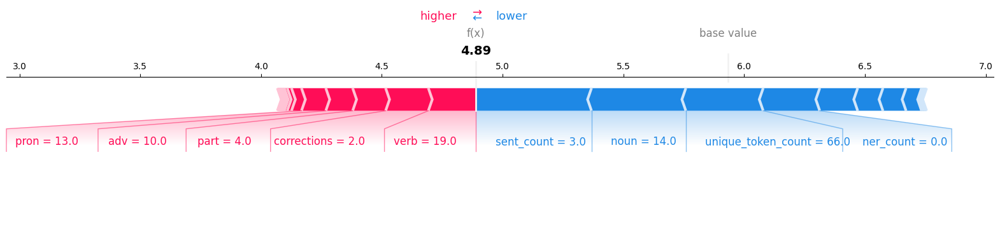

In [49]:
import matplotlib

shap.force_plot(explainer.expected_value, shap_values[0, :], X_test.iloc[0, :],  matplotlib=matplotlib)

#### 2. Let's visualize a many predictions
Let's visualize first 1000 test predictions

In [53]:
# print the JS visualization code to the notebook
shap.initjs()
shap.force_plot(
    explainer.expected_value, shap_values[:1000, :], X_test.iloc[:1000, :],
)

#### 3. Bar chart of mean importance
This takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

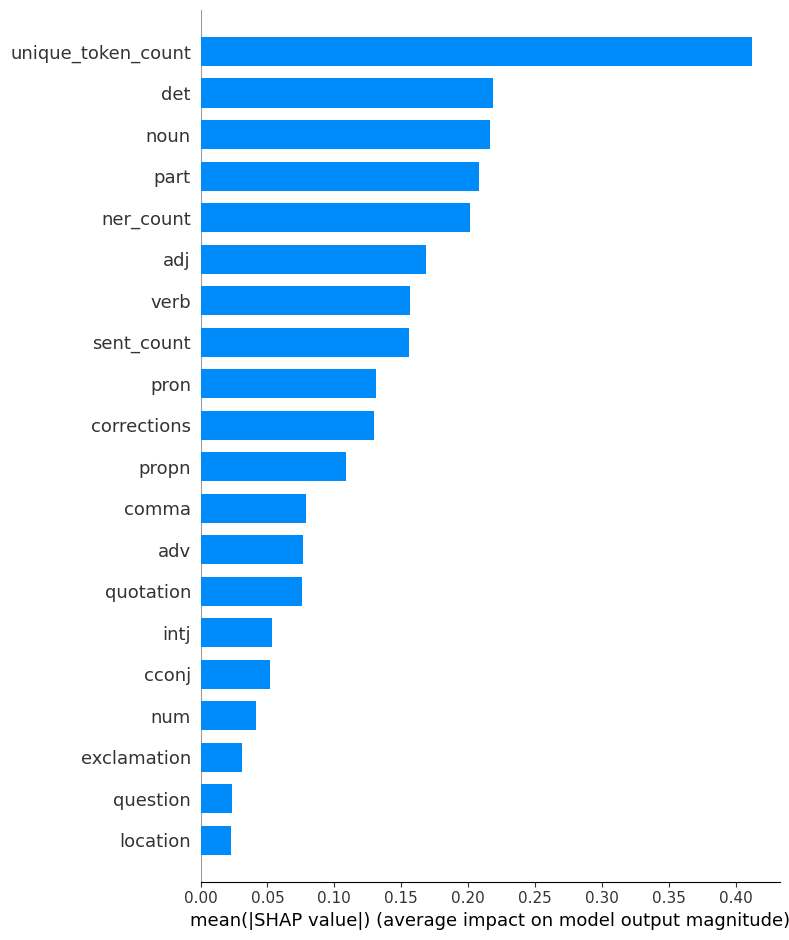

In [54]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

#### 4. SHAP Summary Plot
To determine the relative influence of each feature on the model output for each individual in the validation dataset, we employ a density scatter plot of the SHAP values for each feature instead of a standard feature relevance bar chart. The total of the SHAP value magnitudes for all samples is used to order features.

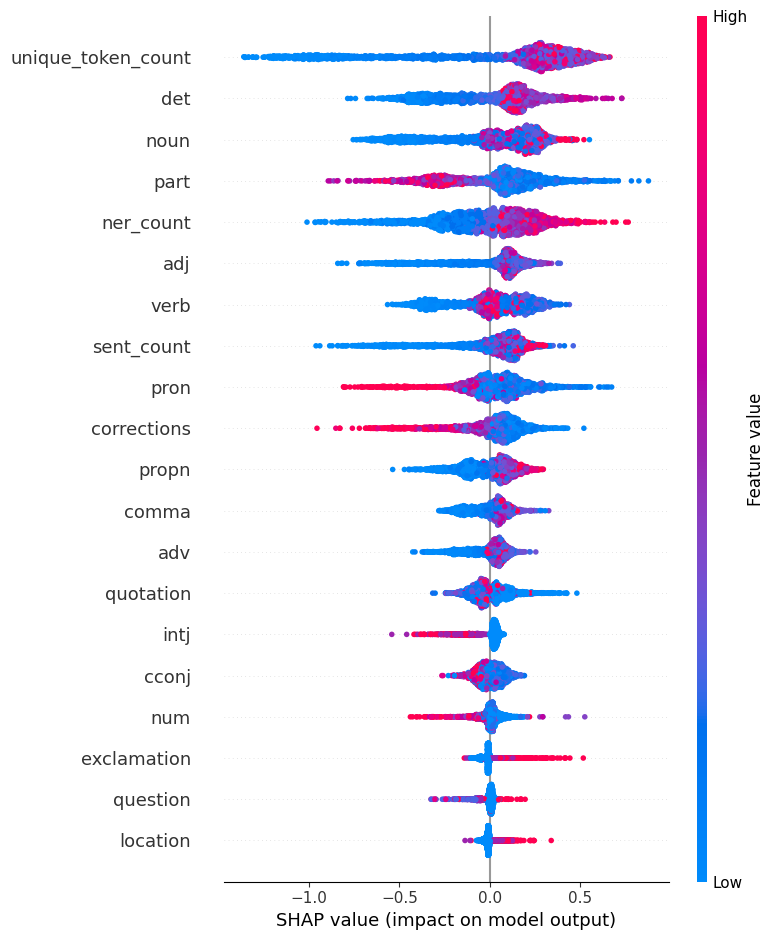

In [56]:
shap.summary_plot(shap_values, X_test)

#### 5. SHAP Dependence Plots
SHAP dependence plots show the effect of a single feature across the whole dataset. They plot a feature’s value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

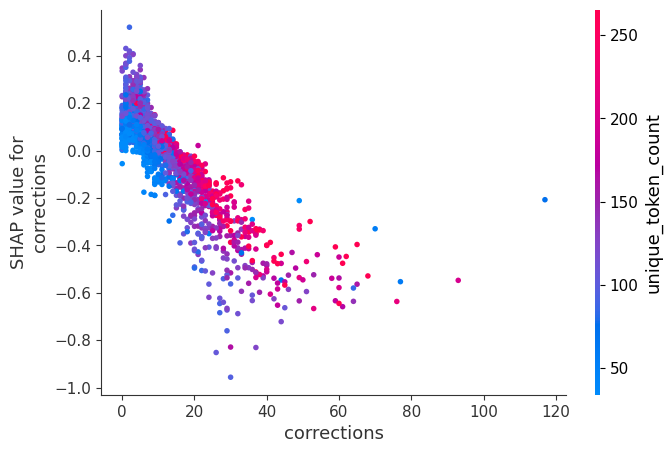

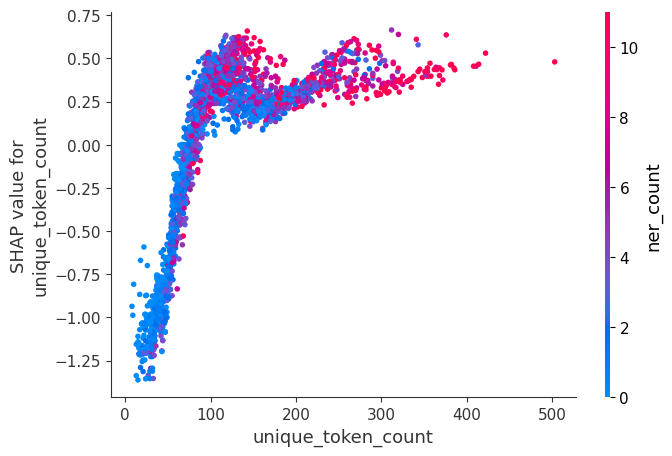

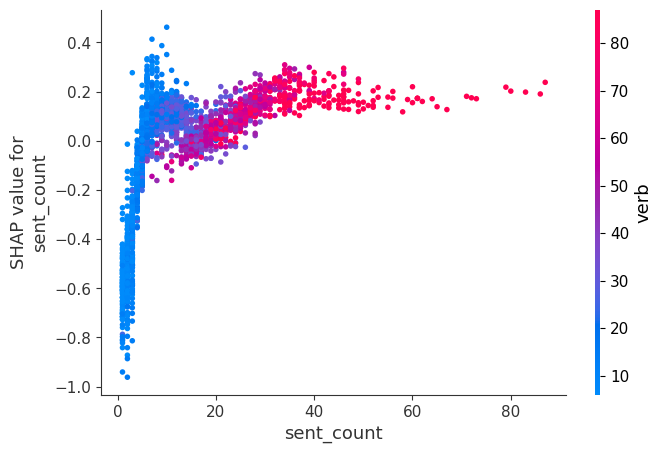

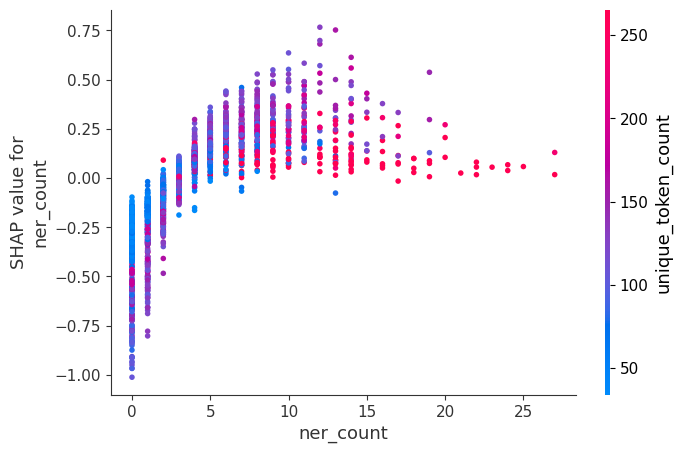

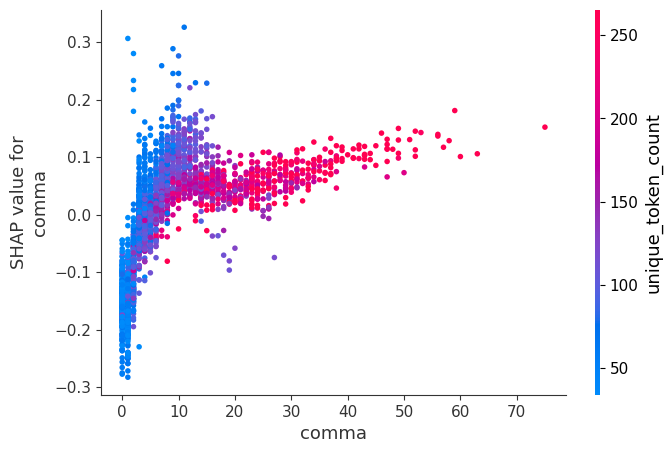

...

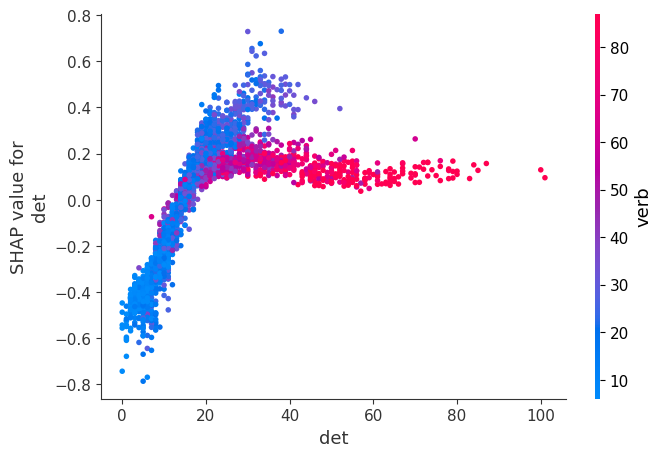

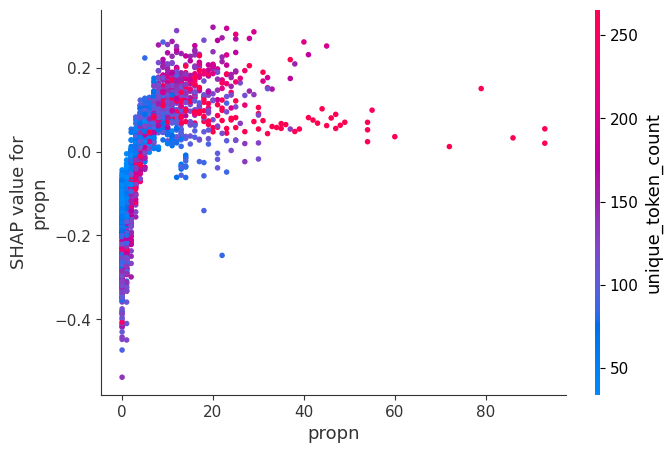

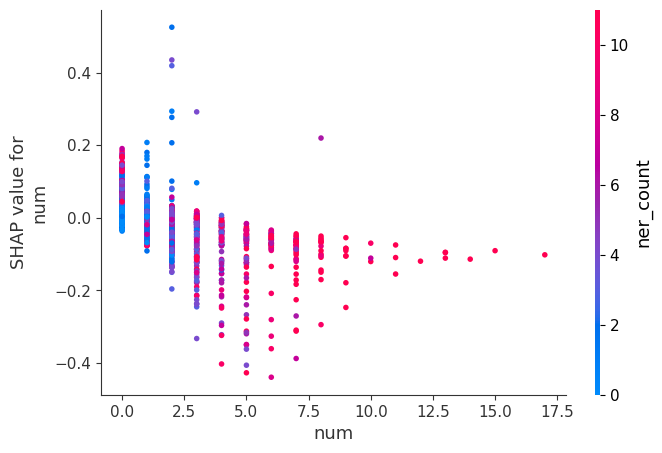

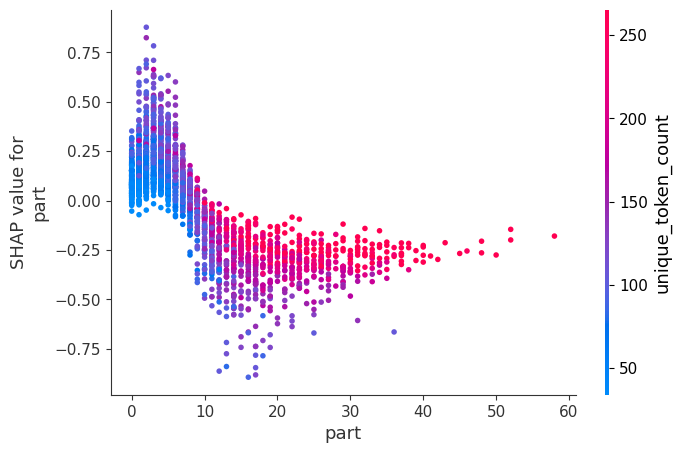

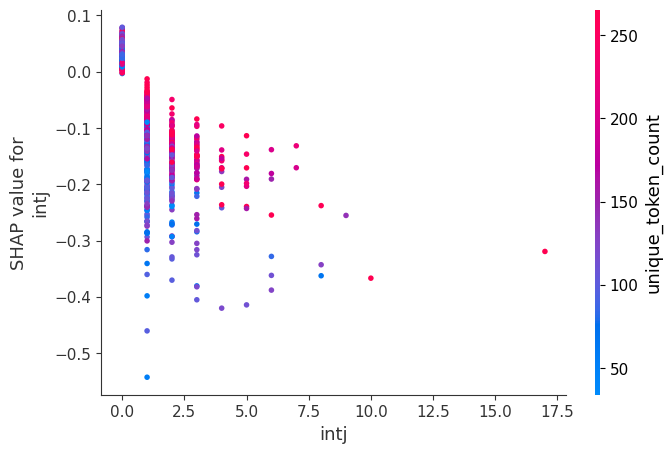

In [58]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X_test, display_features=X_test)
